In [1]:
from functions import *
from embed_functions import *

# print full arrays/dataframes for debugging
# np.set_printoptions(threshold=sys.maxsize)
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

# Import filepaths
datacode, filepaths_raw = import_ima()
print("Number of filepaths before filtering:{}".format(len(filepaths_raw)))

# Remove all filepaths involved in TP quotes
filepaths = process_filepaths(filepaths_raw)
print("Number of filepaths after filtering:{}".format(len(filepaths)))

df = pd.DataFrame()
df["filepaths"] = filepaths

Using TensorFlow backend.


./ima/20200215.dat
importing next...
./ima/20200216.dat
importing next...
./ima/20200217.dat
importing next...
./ima/20200218.dat
importing next...
./ima/20200219.dat
importing next...
./ima/20200220.dat
importing next...
./ima/20200221.dat
importing next...
./ima/20200222.dat
importing next...
./ima/20200223.dat
importing next...
./ima/20200224.dat
importing next...
All IMA measurements in ./ima/ imported successfully.
Number of filepaths before filtering:130432
Number of filepaths after filtering:74992


In [2]:
model, encoded_fps = do_doc2vec(filepaths, epochs=150)


Explained variation per principal component:[0.15129659 0.10962795 0.08861656]
showing plot...


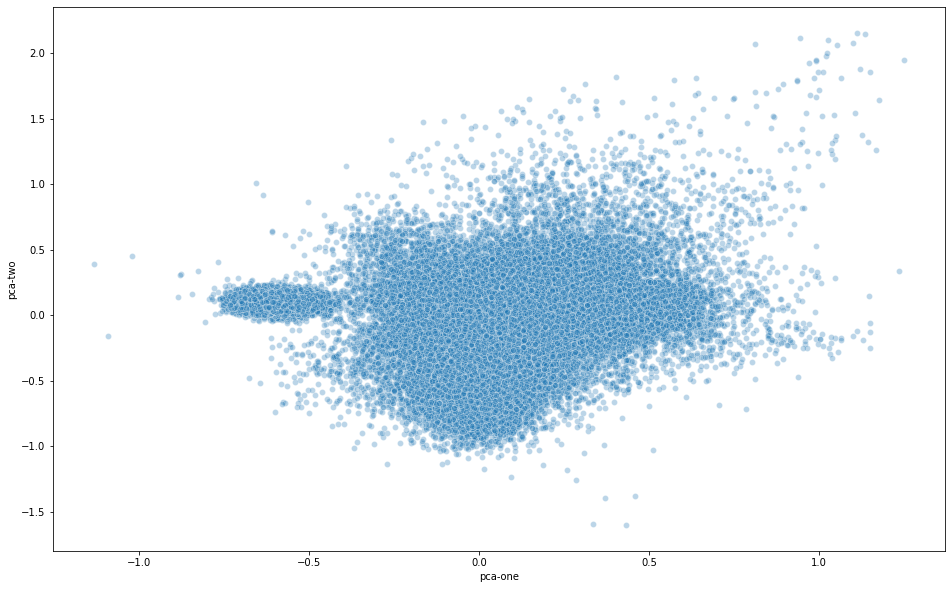

array([[-0.17123662,  0.12273858, -0.18743408, ..., -0.47375435,
         0.06089167,  0.0714678 ],
       [-0.13486779,  0.15238887, -0.06771385, ..., -0.00575272,
         0.237737  , -0.54890573],
       [-0.13847528, -0.05826246, -0.11920481, ...,  0.02054609,
        -0.03936034, -0.04772274],
       ...,
       [-0.15910798,  0.13164745, -0.21304601, ..., -0.5964816 ,
         0.04038427,  0.04345243],
       [-0.13877167,  0.15693252, -0.2014579 , ..., -0.5964209 ,
         0.05902493,  0.02299116],
       [-0.17587247,  0.15579869, -0.13660914, ..., -0.6584814 ,
         0.08876759,  0.0570963 ]], dtype=float32)

In [3]:
func_pca(datanp=encoded_fps, feat_cols=range(1,51), drawplot=1, n_components=3)


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 74992 samples in 1.041s...
[t-SNE] Computed neighbors for 74992 samples in 797.667s...
[t-SNE] Computed conditional probabilities for sample 1000 / 74992
[t-SNE] Computed conditional probabilities for sample 2000 / 74992
[t-SNE] Computed conditional probabilities for sample 3000 / 74992
[t-SNE] Computed conditional probabilities for sample 4000 / 74992
[t-SNE] Computed conditional probabilities for sample 5000 / 74992
[t-SNE] Computed conditional probabilities for sample 6000 / 74992
[t-SNE] Computed conditional probabilities for sample 7000 / 74992
[t-SNE] Computed conditional probabilities for sample 8000 / 74992
[t-SNE] Computed conditional probabilities for sample 9000 / 74992
[t-SNE] Computed conditional probabilities for sample 10000 / 74992
[t-SNE] Computed conditional probabilities for sample 11000 / 74992
[t-SNE] Computed conditional probabilities for sample 12000 / 74992
[t-SNE] Computed conditional probabilities for 

<Figure size 1152x720 with 0 Axes>

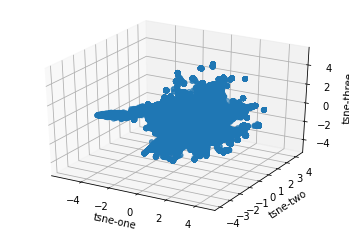

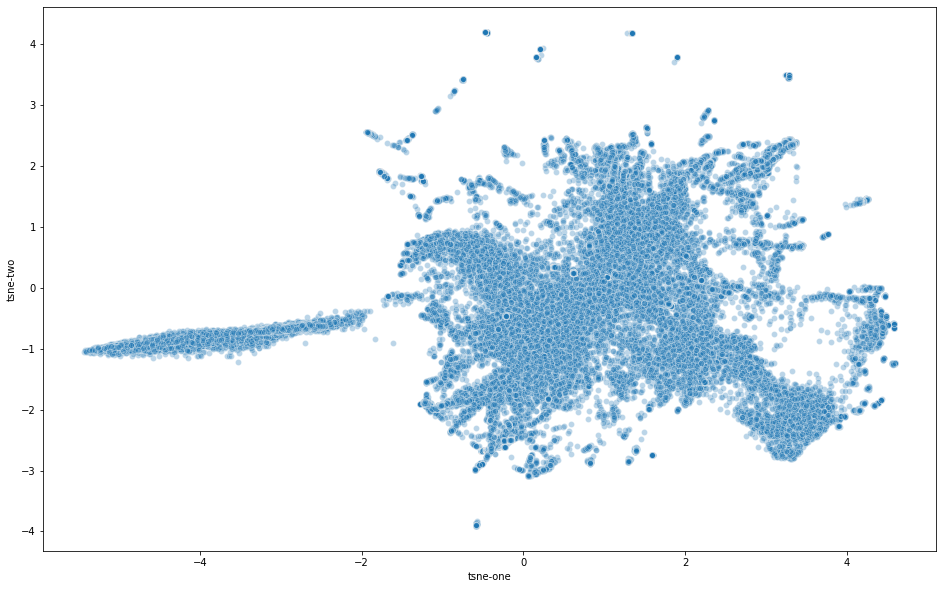

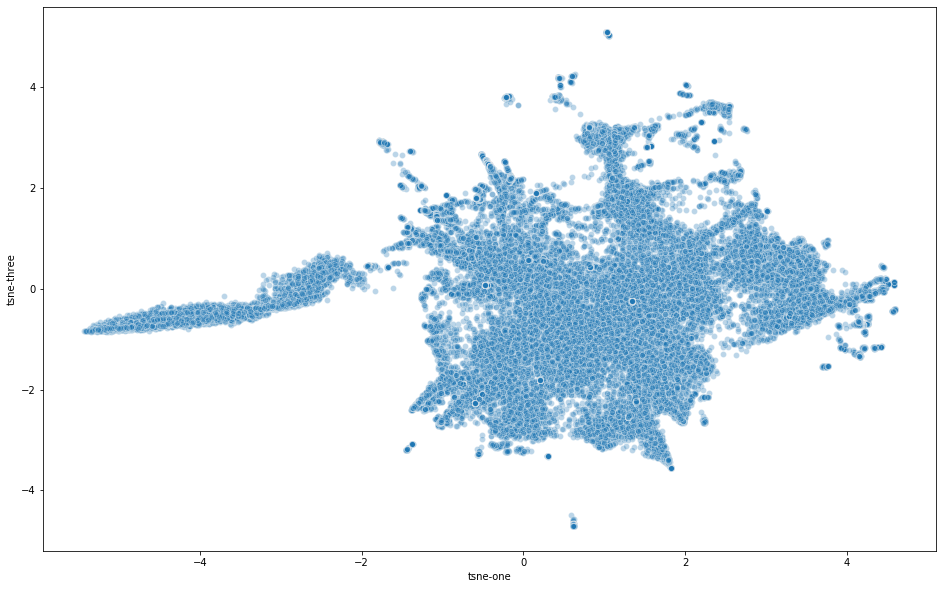

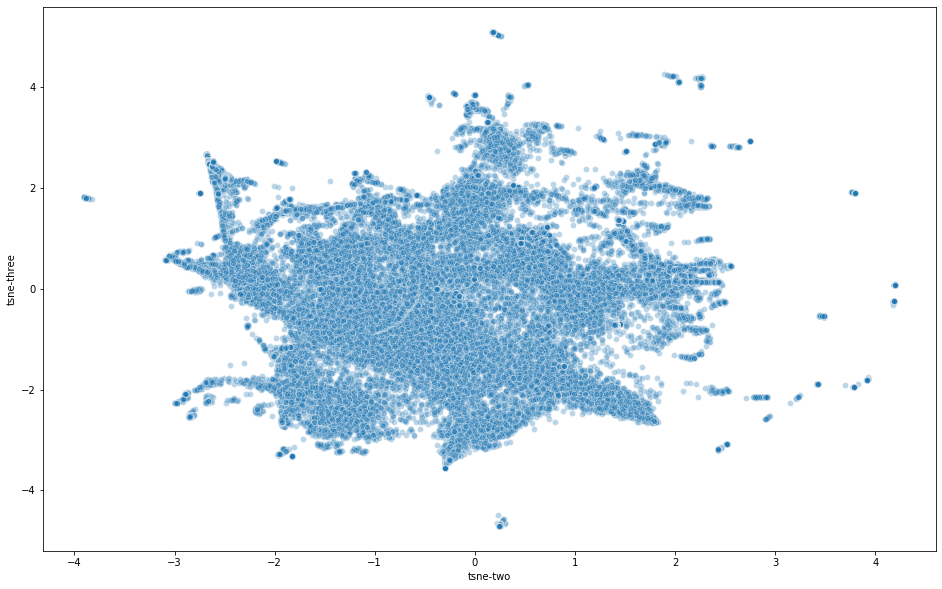

showing  tsne  plot...


array([[-0.17123662,  0.12273858, -0.18743408, ..., -2.6062424 ,
        -0.5856731 ,  0.18509153],
       [-0.13486779,  0.15238887, -0.06771385, ...,  3.9775841 ,
        -2.0969534 , -1.2043558 ],
       [-0.13847528, -0.05826246, -0.11920481, ...,  1.7133979 ,
        -0.5037376 ,  1.0631899 ],
       ...,
       [-0.15910798,  0.13164745, -0.21304601, ..., -2.7382967 ,
        -0.6152462 , -0.11078079],
       [-0.13877167,  0.15693252, -0.2014579 , ..., -2.8996744 ,
        -0.6861154 , -0.27105153],
       [-0.17587247,  0.15579869, -0.13660914, ..., -3.8955488 ,
        -0.8708922 , -0.62542784]], dtype=float32)

In [4]:
func_tsne(datanp=encoded_fps, feat_cols=range(1,51), drawplot=1, n_components=3)


C:\Users\root01\Anaconda3\envs\fouryp\lib\site-packages\numba\typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\Anaconda3\envs\fouryp\lib\site-packages\umap\rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
C:\Users\root01\Anaconda3\envs\fouryp\lib\site-packages\numba\typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\Anaconda3\envs\fouryp\lib\site-packages\um

UMAP done! Time elapsed: 161.03322100639343 seconds
umap done in 3 dimensions


<Figure size 1152x720 with 0 Axes>

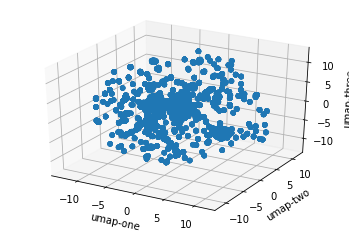

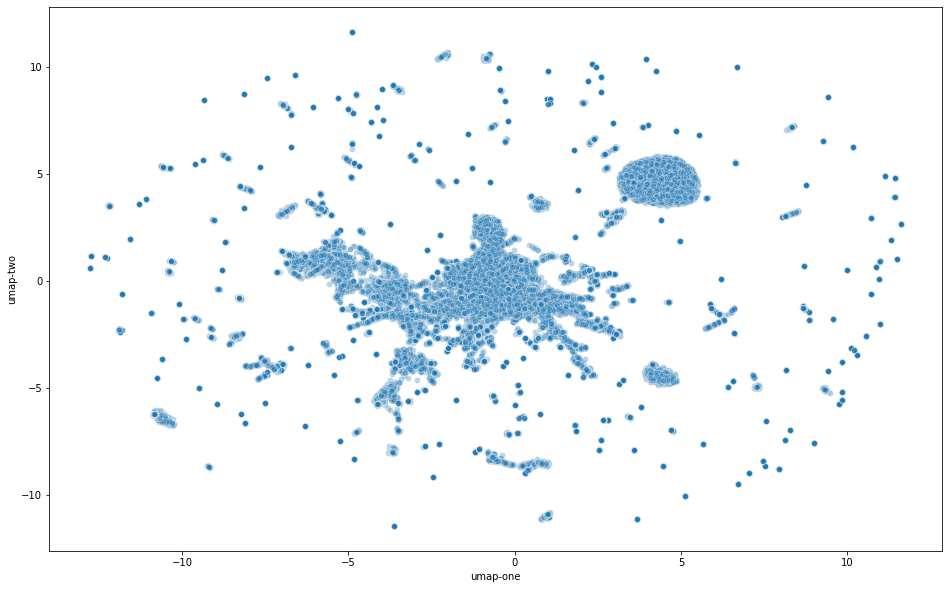

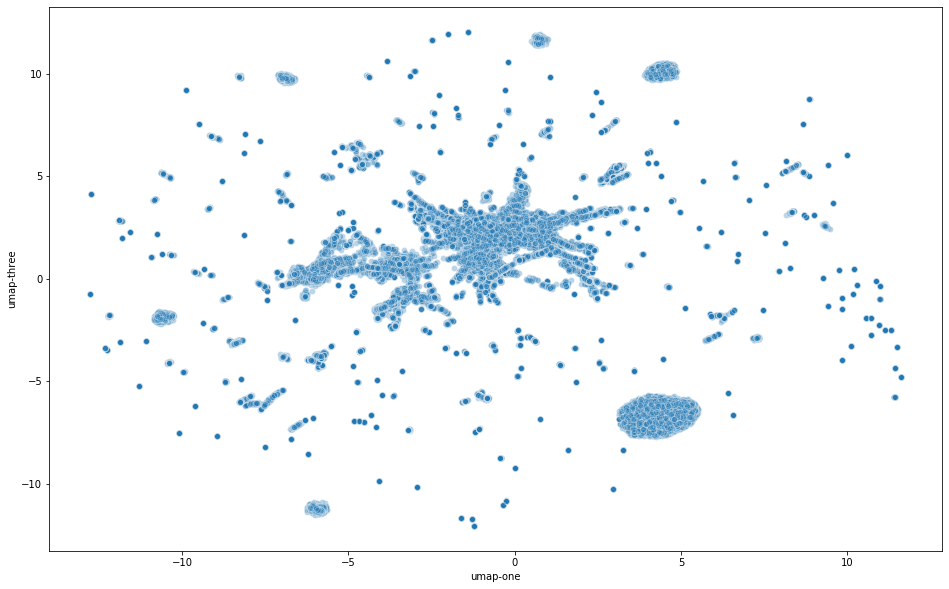

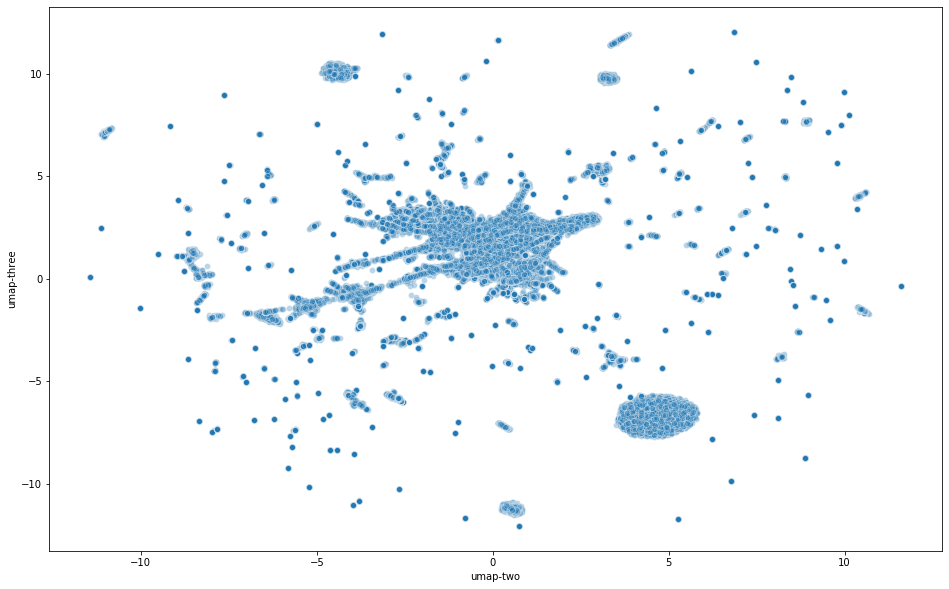

showing  umap  plot...


In [5]:
dataumap = func_umap(datanp=encoded_fps, feat_cols=range(1,51), drawplot=1, n_components=3)

In [6]:
print(dataumap.shape)



(74992, 53)


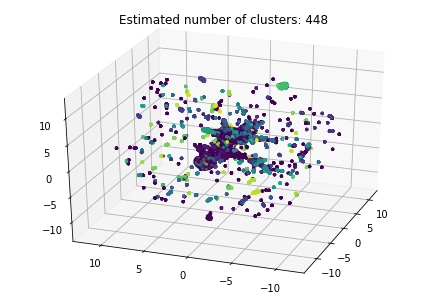

number of cluster found: 449
cluster for each point:  [ -1  -1   0 ...  -1 441  -1]


In [9]:
dataumap_clustered = func_dbscan(data=dataumap[:, [50, 51, 52]],
                        eps=0.1,
                        min_samples=20,
                        drawplot=1)

In [10]:
feat_cols = []
feat_cols.append("filepaths")
explore_cluster(datanp=filepaths, 
                dataclust=dataumap_clustered,
                cols=feat_cols,
                filepaths=filepaths
               )

,filepaths,cluster
0,"[root, ima_archive, data, last.dat]",-1.0
34472,"[lib, modules, 4.15.0-88-generic, kernel, net, atm, clip.ko]",-1.0
34471,"[lib, modules, 4.15.0-88-generic, kernel, net, atm, atm.ko]",-1.0
34464,"[lib, modules, 4.15.0-88-generic, kernel, net, bluetooth, bluetooth_6lowpan.ko]",-1.0
34463,"[lib, modules, 4.15.0-88-generic, kernel, net, bluetooth, hidp, hidp.ko]",-1.0
34462,"[lib, modules, 4.15.0-88-generic, kernel, net, bluetooth, cmtp, cmtp.ko]",-1.0
34461,"[lib, modules, 4.15.0-88-generic, kernel, net, bluetooth, bnep, bnep.ko]",-1.0
34460,"[lib, modules, 4.15.0-88-generic, kernel, net, bluetooth, rfcomm, rfcomm.ko]",-1.0
34459,"[lib, modules, 4.15.0-88-generic, kernel, net, bluetooth, bluetooth.ko]",-1.0
34458,"[lib, modules, 4.15.0-88-generic, kernel, net, can, can-gw.ko]",-1.0
